# Import Packages

In [1]:
import os, sys, json, cv2, time, glob, gc, datetime
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import matplotlib.patches as patches
import seaborn as sns; sns.set(font_scale=1.4)
import warnings

from tqdm import tqdm
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Reshape
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler, TensorBoard, ModelCheckpoint
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from kerastuner import HyperModel, Hyperband
from kerastuner.tuners import RandomSearch
from keras.layers import BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", palette="colorblind", font="sans-serif", context="notebook")

/var/folders/nv/cddx4y_s46n_4yhxp7v2bb540000gn/T/ipykernel_20111/1807207147.py:21: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperModel, Hyperband


# Configurations

In [2]:
class_names = ['mountain', 'street', 'glacier', 'buildings', 'sea', 'forest']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

nb_classes = len(class_names)

EPOCHS = 20
IMAGE_SIZE = (150, 150)
BATCH_SIZE = 32
SEED = 42

In [3]:
class_names_label

{'mountain': 0,
 'street': 1,
 'glacier': 2,
 'buildings': 3,
 'sea': 4,
 'forest': 5}

# Data Loading

In [4]:
def load_data():
    """
        Load the data:
            - 14,034 images to train the network.
            - 3,000 images to evaluate how accurately the network learned to classify images.
    """
    datasets = ['./natural-scene-data/seg_val/seg_val', './natural-scene-data/seg_train/seg_train']
    images = []
    labels = []
    splits = []
    label_names = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        print("Loading {}".format(dataset))
        split = dataset.split('_')[-1]
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            if folder not in class_names_label:
                continue  # Skip files that are not in the class_names_label dictionary
            label = class_names_label[folder]
            label_name = folder
            
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                
                # Append the image and its corresponding label to the lists
                image = image / 255.0 # Normalize the pixel values, data scaling
                images.append(image)
                labels.append(label)
                splits.append(split)
                label_names.append(label_name)
                
    # Convert lists to numpy arrays
    images = np.array(images, dtype='float32')
    labels = np.array(labels, dtype='int32')
    
    # Create a DataFrame
    df = pd.DataFrame({'Image': list(images), 'Label': labels, 'Label_names': label_names, 'Split': splits})
    df = shuffle(df, random_state=SEED)
    df = df.reset_index(drop=True)
    return df

def load_test_data():
    datasets = ['./natural-scene-data/seg_test/seg_test']
    images = []
    
    # Iterate through training and test sets
    for dataset in datasets:
            print("Loading {}".format(dataset))
            # Iterate through each folder corresponding to a category
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(dataset)):
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                    # Get the path name of the image
                    img_path = os.path.join(dataset, file)
                    
                    # Open and resize the img
                    image = cv2.imread(img_path)
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, IMAGE_SIZE) 
                    
                    # Append the image and its corresponding label to the lists
                    image = image / 255.0 # Normalize the pixel values, data scaling
                    images.append(image)
                
    # Convert lists to numpy arrays
    images = np.array(images, dtype='float32')
    return images

In [5]:
df = load_data()
df.head()

Loading ./natural-scene-data/seg_val/seg_val


  0%|          | 0/474 [00:00<?, ?it/s]

100%|██████████| 510/510 [00:00<00:00, 858.83it/s] 


Loading ./natural-scene-data/seg_train/seg_train


100%|██████████| 2274/2274 [00:04<00:00, 560.49it/s]


,Image,Label,Label_names,Split
0,"[[[0.24313726, 0.28235295, 0.38039216], [0.101...",1,street,train
1,"[[[0.8117647, 0.8117647, 0.85882354], [0.79607...",3,buildings,train
2,"[[[0.18431373, 0.1764706, 0.09411765], [0.3372...",1,street,train
3,"[[[0.3647059, 0.4627451, 0.72156864], [0.36862...",0,mountain,val
4,"[[[0.2509804, 0.3254902, 0.21568628], [0.13725...",5,forest,train


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17034 entries, 0 to 17033
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Image        17034 non-null  object
 1   Label        17034 non-null  int32 
 2   Label_names  17034 non-null  object
 3   Split        17034 non-null  object
dtypes: int32(1), object(3)
memory usage: 465.9+ KB


In [7]:
df['Label_names'].value_counts()

Label_names
mountain     3037
glacier      2957
street       2883
sea          2784
forest       2745
buildings    2628
Name: count, dtype: int64

In [8]:
df['Split'].value_counts()

Split
train    14034
val       3000
Name: count, dtype: int64

# EDA

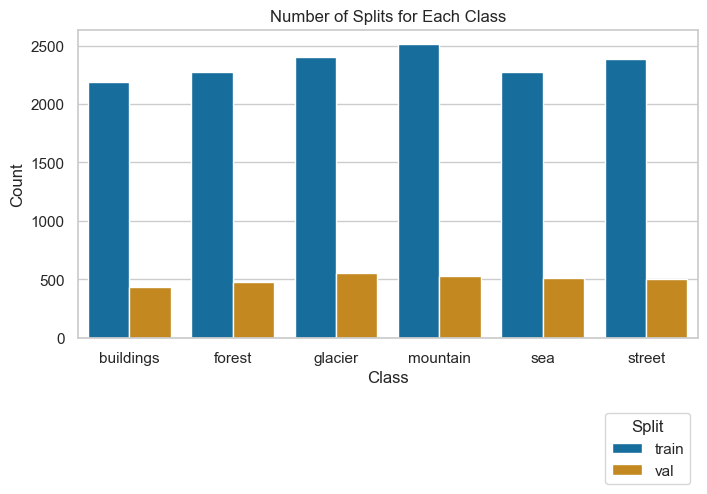

In [9]:
split_counts = df.groupby(['Label_names', 'Split']).size().reset_index(name='Count')

# Plot the results
plt.figure(figsize=(8, 4))
sns.barplot(x='Label_names', y='Count', hue='Split', data=split_counts)
plt.title('Number of Splits for Each Class')
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend(title='Split', loc='lower right', bbox_to_anchor=(1, -0.5))
plt.show()

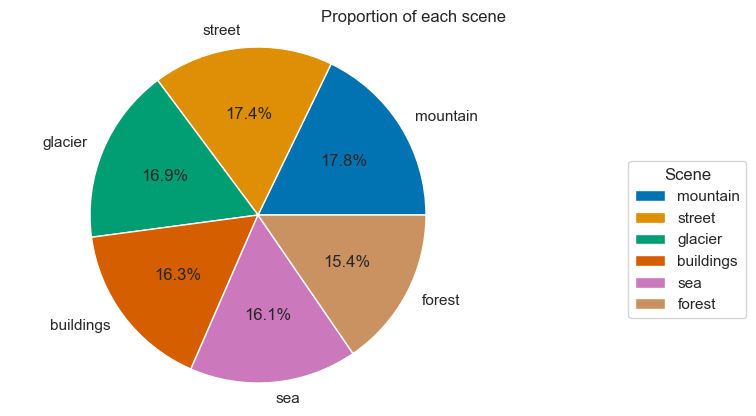

In [10]:
plt.pie(df['Label_names'].value_counts(),
        explode=(0, 0, 0, 0, 0, 0) , 
        labels=class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each scene', loc='right')
plt.legend(title='Scene', loc='lower right', bbox_to_anchor=(1.5, 0.2))
plt.show()

## Visualize the data

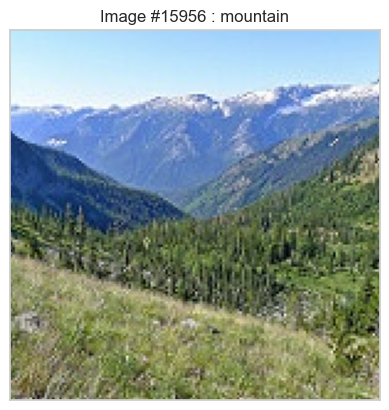

In [11]:
def display_random_image(df):
    """
        Display a random image from the images array and its correspond label from the labels array.
    """
    
    index = np.random.randint(df.shape[0])
    plt.figure()
    plt.imshow(df['Image'][index])
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.title('Image #{} : '.format(index) + df['Label_names'][index])
    plt.show()

display_random_image(df)

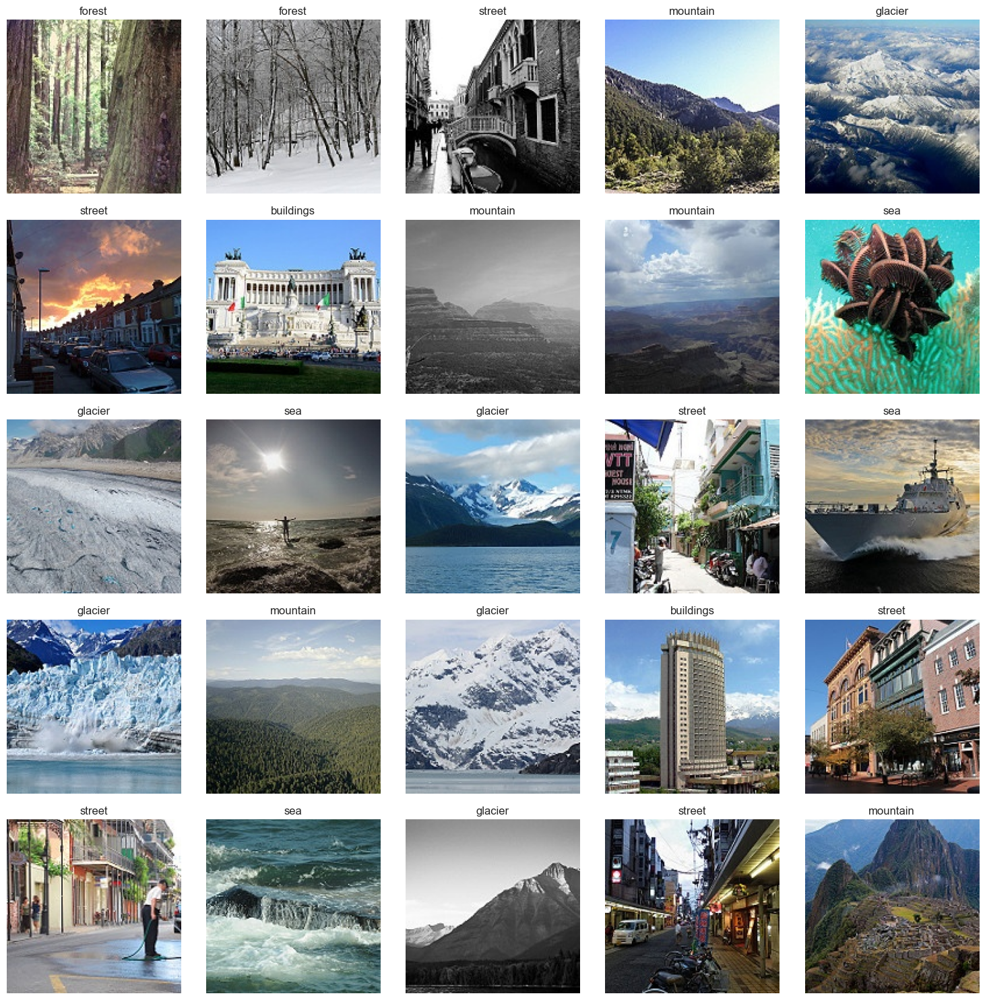

In [12]:
def display_example_images(df):
    """
        Display 25 random images from the images array with their corresponding labels.
    """
    # Select 25 random indices
    indices = np.random.choice(df.shape[0], 25, replace=False)
    
    # Create a grid of subplots
    fig, axes = plt.subplots(5, 5, figsize=(15, 15))
    axes = axes.flatten()
    
    for ax, index in zip(axes, indices):
        ax.imshow(df['Image'][index])
        ax.set_title(df['Label_names'][index])
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

display_example_images(df)

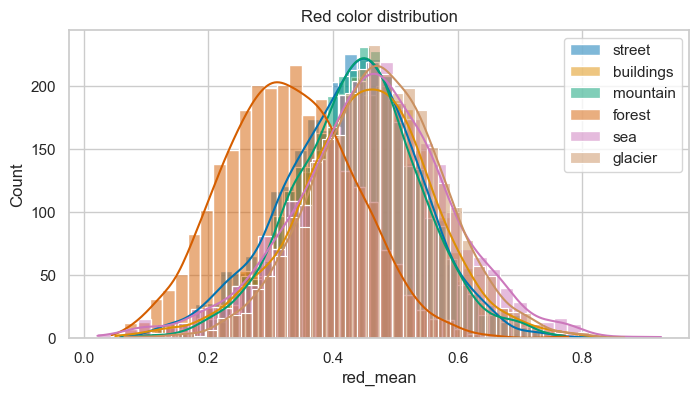

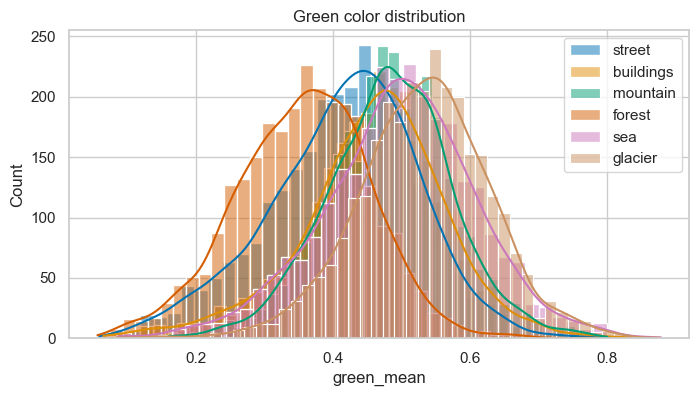

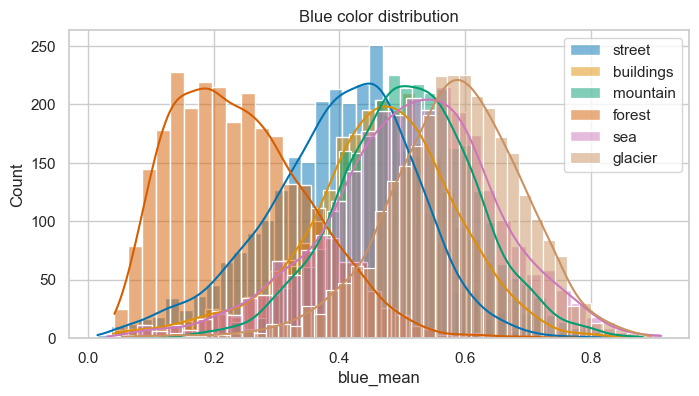

In [13]:
# Analyze the distribution of color channels (RGB) to understand the color composition of the images
def create_rgb_df(sample_df):
    """
    Create a DataFrame with mean and standard deviation of RGB channels for each image.
    """
    red_mean = []
    red_std = []
    green_mean = []
    green_std = []
    blue_mean = []
    blue_std = []
    
    for img in sample_df["Image"].values:
        red_m = img[:, :, 0].mean()
        red_s = img[:, :, 0].std()
        green_m = img[:, :, 1].mean()
        green_s = img[:, :, 1].std()
        blue_m = img[:, :, 2].mean()
        blue_s = img[:, :, 2].std()
        
        red_mean.append(red_m)
        red_std.append(red_s)
        green_mean.append(green_m)
        green_std.append(green_s)
        blue_mean.append(blue_m)
        blue_std.append(blue_s)

    create_df = pd.DataFrame({
        "red_mean": red_mean,
        "red_std": red_std,
        "green_mean": green_mean,
        "green_std": green_std,
        "blue_mean": blue_mean,
        "blue_std": blue_std
    })
    
    # Replace infinite values with NaN
    create_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Optionally, drop or fill NaN values
    create_df.dropna(inplace=True)
    # or
    # create_df.fillna(0, inplace=True)
    
    return create_df

def plot_color_distribution(df, category_col, color_channel):
    """
    Plot the distribution of the specified color channel for each category.
    """
    categories = df[category_col].unique()
    plt.figure(figsize=(8, 4))
    
    for category in categories:
        sample_df = df[df[category_col] == category]
        rgb_df = create_rgb_df(sample_df)
        sns.histplot(rgb_df[f"{color_channel}_mean"], label=category, kde=True)
    
    plt.title(f"{color_channel.capitalize()} color distribution")
    plt.legend()
    plt.show()

plot_color_distribution(df, "Label_names", "red")
plot_color_distribution(df, "Label_names", "green")
plot_color_distribution(df, "Label_names", "blue")

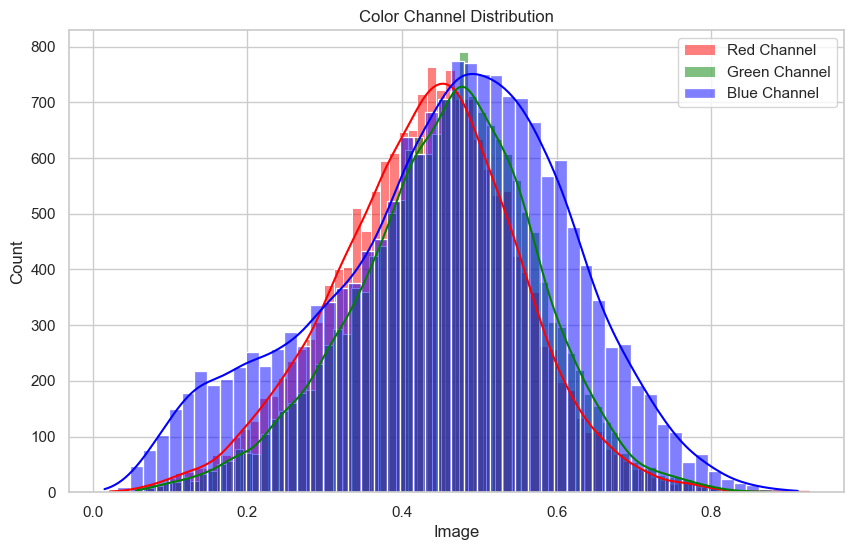

In [14]:
def plot_color_channel_distribution(df, image_col):
    red_means = df[image_col].apply(lambda img: img[:, :, 0].mean())
    green_means = df[image_col].apply(lambda img: img[:, :, 1].mean())
    blue_means = df[image_col].apply(lambda img: img[:, :, 2].mean())
    
    plt.figure(figsize=(10, 6))
    sns.histplot(red_means, kde=True, color='red', label='Red Channel')
    sns.histplot(green_means, kde=True, color='green', label='Green Channel')
    sns.histplot(blue_means, kde=True, color='blue', label='Blue Channel')
    plt.title('Color Channel Distribution')
    plt.legend()
    plt.show()

# Example usage
plot_color_channel_distribution(df, 'Image')

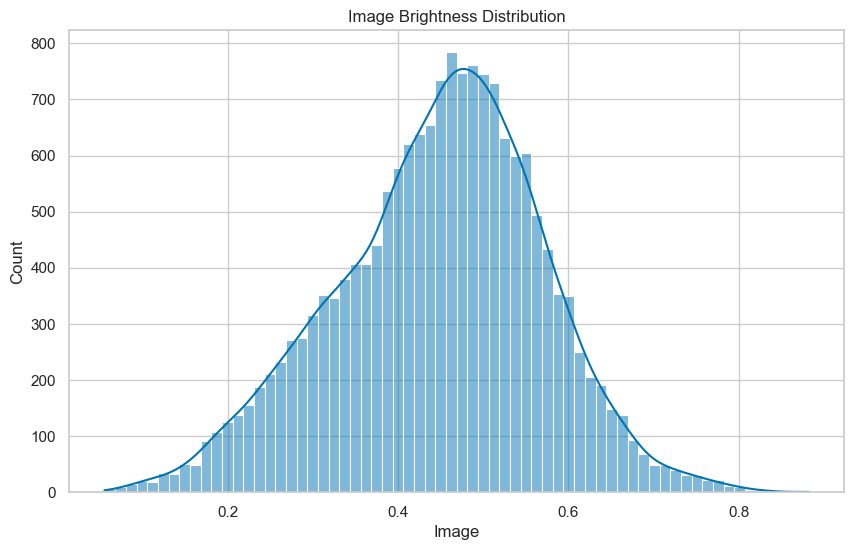

In [15]:
def plot_brightness_distribution(df, image_col):
    brightness = df[image_col].apply(lambda img: np.mean(img))
    
    plt.figure(figsize=(10, 6))
    sns.histplot(brightness, kde=True)
    plt.title('Image Brightness Distribution')
    plt.show()

# Example usage
plot_brightness_distribution(df, 'Image')

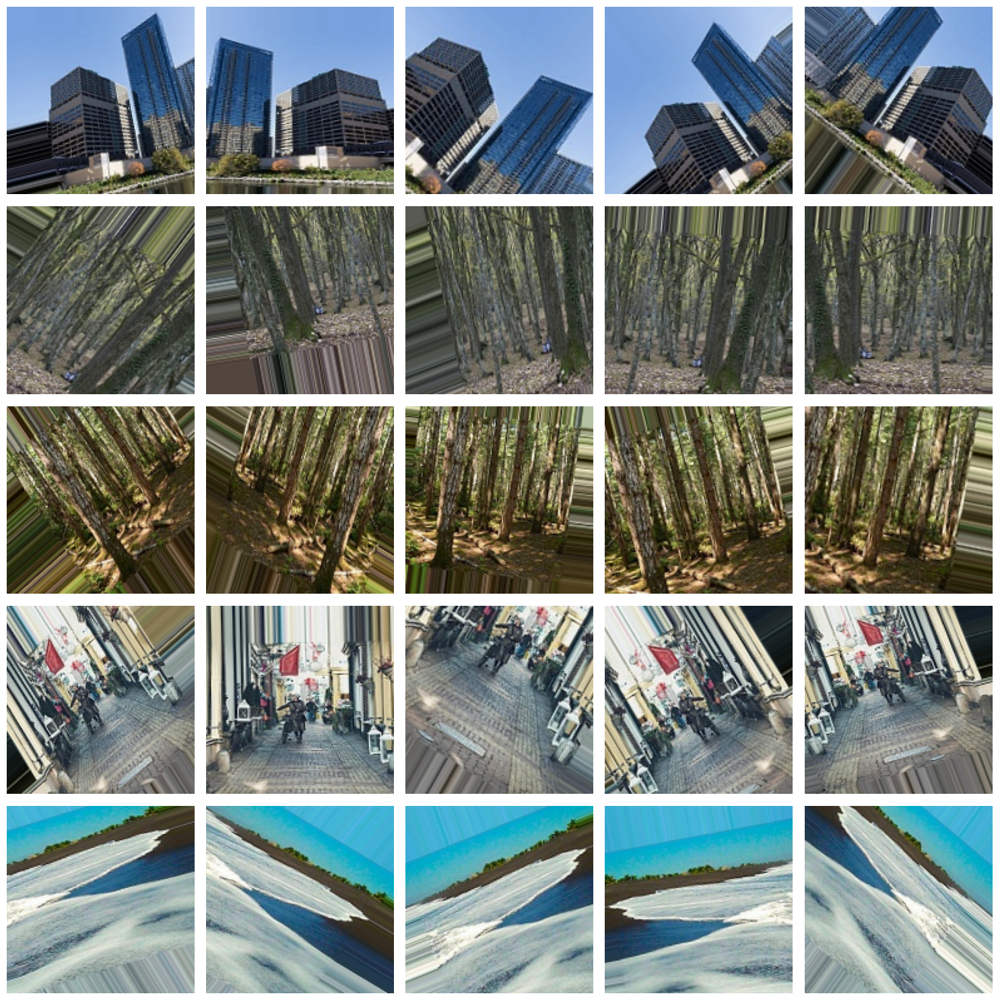

In [16]:
# Visualize the effects of image augmentation techniques like rotation, flipping, and zooming
def plot_image_augmentation(df, image_col, num_samples=5):
    datagen = ImageDataGenerator(rotation_range=40, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')
    sample_images = df[image_col].sample(num_samples).values * 255.0
    fig, axes = plt.subplots(num_samples, 5, figsize=(15, 15))
    
    for i, img in enumerate(sample_images):
        img = np.expand_dims(img, 0)
        aug_iter = datagen.flow(img)
        for j in range(5):
            aug_img = next(aug_iter)[0].astype('uint8')
            axes[i, j].imshow(aug_img)
            axes[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_image_augmentation(df, 'Image')

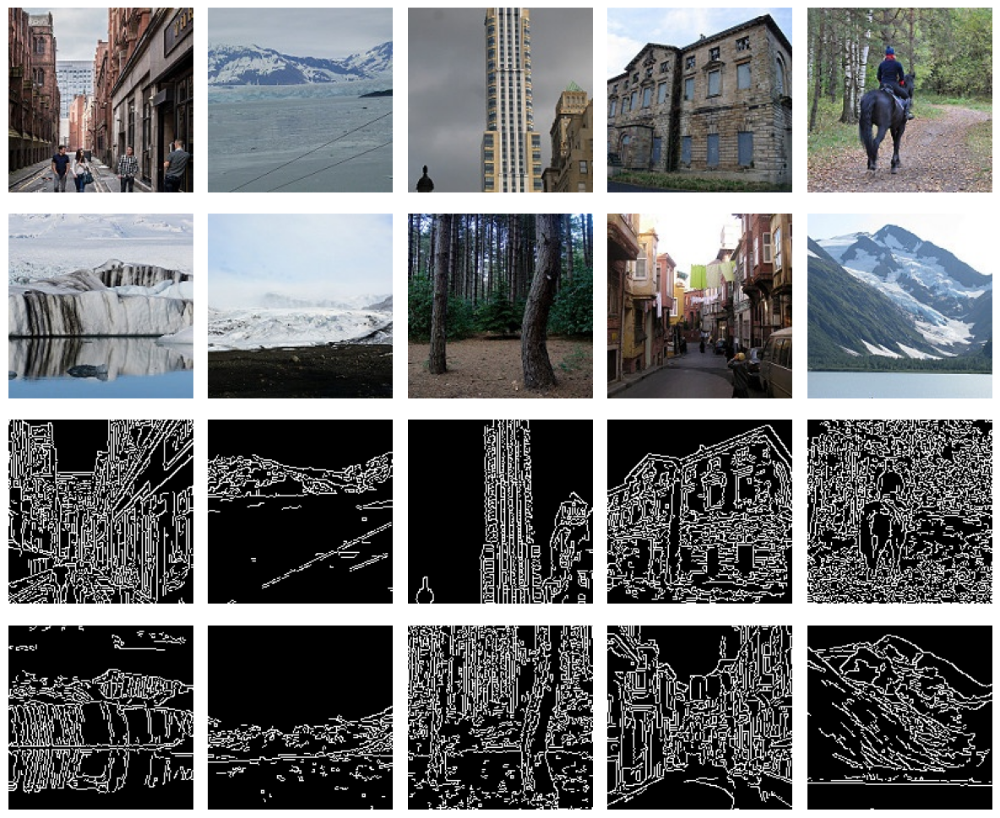

In [17]:
def plot_edge_detection(df, image_col, num_samples=10):
    sample_images = df[image_col].sample(num_samples).values
    fig, axes = plt.subplots(4, 5, figsize=(12, 10))
    
    for i, img in enumerate(sample_images):
        # Ensure the image is in the correct format
        if img.dtype != 'uint8':
            img = (img * 255).astype('uint8')
        # Convert the image to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply Canny edge detection
        edges = cv2.Canny(gray_img, 100, 200)
        
        # Plot original image
        row, col = divmod(i, 5)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        
        # Plot edge-detected image
        axes[row + 2, col].imshow(edges, cmap='gray')
        axes[row + 2, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_edge_detection(df, 'Image')

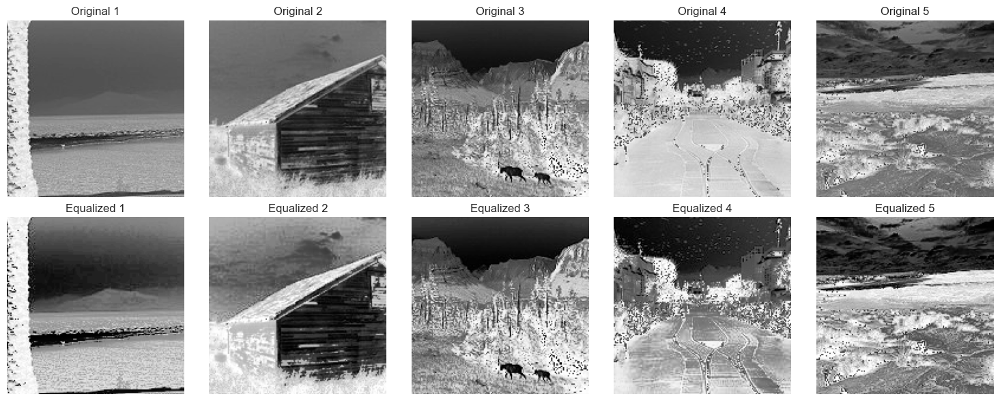

In [18]:
'''Histogram equalization is a technique used in image processing to improve the contrast of an image. The purpose of histogram equalization is to enhance the visibility of features in an image by spreading out the most frequent intensity values. This technique is particularly useful for images with backgrounds and foregrounds that are both bright or both dark.

Key Purposes of Histogram Equalization:
Enhance Contrast:

Histogram equalization redistributes the intensity values of the image, making the histogram of the output image more uniform. This enhances the contrast of the image, making details more visible.
Improve Visibility:

By enhancing the contrast, histogram equalization makes features in the image more distinguishable. This is particularly useful in medical imaging, satellite imagery, and other fields where detail visibility is crucial.
Normalize Lighting Conditions:

It helps in normalizing the lighting conditions in an image, making it easier to analyze and interpret. This is useful in scenarios where images are taken under varying lighting conditions.'''

def plot_histogram_equalization(df, image_col, num_samples=5):
    sample_images = df[image_col].sample(num_samples).values * 255.0
    fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
    
    for i, img in enumerate(sample_images):
        # Ensure the image is in the correct format
        if img.dtype != 'uint8':
            img = (img * 255).astype('uint8')
        # Convert the image to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply histogram equalization
        equalized_img = cv2.equalizeHist(gray_img)
        
        axes[0, i].imshow(gray_img, cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Original {i+1}')
        
        axes[1, i].imshow(equalized_img, cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Equalized {i+1}')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_histogram_equalization(df, 'Image')

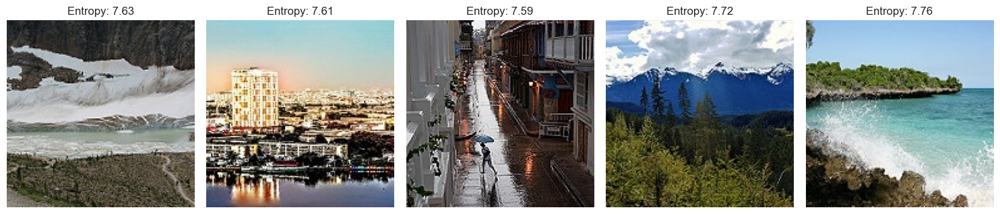

In [19]:
from skimage.measure import shannon_entropy

def plot_image_entropy(df, image_col, num_samples=5):
    sample_images = df[image_col].sample(num_samples).values
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))
    
    for i, img in enumerate(sample_images):
        entropy = shannon_entropy(img)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f'Entropy: {entropy:.2f}')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_image_entropy(df, 'Image')

Sampled image indices: Index([13801, 5556, 295, 719, 14528], dtype='int64')


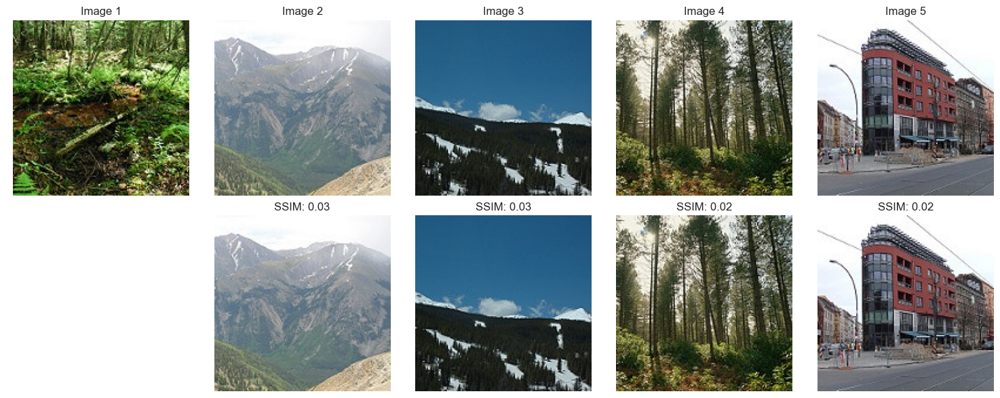

In [20]:
'''
Image similarity analysis is used to measure how similar or different two images are. This can be useful for various purposes in image processing and computer vision, such as:

### Key Purposes of Image Similarity Analysis:

1. **Quality Assessment**:
   - Assess the quality of images by comparing them to reference images. This is useful in applications like image compression, where you want to ensure that the compressed image is similar to the original.

2. **Duplicate Detection**:
   - Detect duplicate or near-duplicate images in a dataset. This can help in cleaning up datasets by removing redundant images.

3. **Image Retrieval**:
   - Retrieve similar images from a database based on a query image. This is useful in content-based image retrieval systems.

4. **Change Detection**:
   - Detect changes between two images taken at different times. This is useful in applications like surveillance, medical imaging, and remote sensing.

5. **Image Registration**:
   - Align images taken from different viewpoints or at different times. This is useful in medical imaging, satellite imaging, and other fields where precise alignment is necessary.

### Structural Similarity Index (SSIM):

The Structural Similarity Index (SSIM) is a method for measuring the similarity between two images. It considers changes in structural information, luminance, and contrast. SSIM values range from -1 to 1, where 1 indicates perfect similarity.

This analysis helps in understanding the similarity between images, which can be useful for various applications such as quality assessment, duplicate detection, and image retrieval.
'''
from skimage.metrics import structural_similarity as ssim

def plot_image_similarity(df, image_col, num_samples=5):
    sample_images = df[image_col].sample(num_samples).values
    sample_indices = df[image_col].sample(num_samples).index
    print("Sampled image indices:", sample_indices)
    
    fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
    
    for i in range(num_samples):
        # Display the sampled images
        axes[0, i].imshow(sample_images[i])
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Image {i+1}')
        
        # Calculate and display SSIM values with the first image
        if i > 0:
            gray_img1 = cv2.cvtColor(sample_images[0], cv2.COLOR_RGB2GRAY)
            gray_img2 = cv2.cvtColor(sample_images[i], cv2.COLOR_RGB2GRAY)
            similarity = ssim(gray_img1, gray_img2, data_range=gray_img1.max() - gray_img1.min())
            axes[1, i].imshow(sample_images[i])
            axes[1, i].axis('off')
            axes[1, i].set_title(f'SSIM: {similarity:.2f}')
        else:
            axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_image_similarity(df, 'Image')

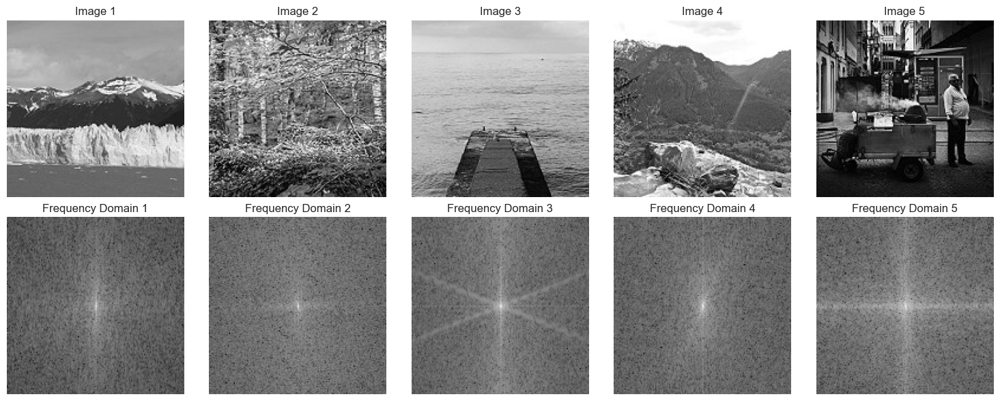

In [21]:
'''
Analyze the frequency domain of images using Fourier Transform to understand the frequency components.
Frequency domain analysis is a technique used to analyze the frequency components of an image. This type of analysis is particularly useful for understanding the underlying patterns and structures in the image that are not easily visible in the spatial domain. Here are the key purposes and benefits of frequency domain analysis:

### Key Purposes of Frequency Domain Analysis:

1. **Identify Periodic Patterns**:
   - Frequency domain analysis can reveal periodic patterns and repetitive structures in an image. These patterns might be difficult to detect in the spatial domain.

2. **Image Filtering**:
   - Frequency domain techniques are often used for image filtering, such as removing noise or enhancing certain features. For example, high-pass filters can be used to enhance edges, while low-pass filters can be used to smooth the image.

3. **Compression**:
   - Frequency domain analysis is used in image compression algorithms (e.g., JPEG). By transforming the image into the frequency domain, it is possible to discard less important frequency components, thereby reducing the file size.

4. **Texture Analysis**:
   - The frequency domain can provide insights into the texture of an image. Different textures will have different frequency characteristics, which can be useful for texture classification and segmentation.

5. **Feature Extraction**:
   - Frequency components can be used as features for image classification and other machine learning tasks. These features can capture important information about the image that is not apparent in the spatial domain.

Analyze the frequency domain of images using Fourier Transform to understand the frequency components.'''

def plot_frequency_domain(df, image_col, num_samples=5):
    sample_images = df[image_col].sample(num_samples).values * 255.0
    fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
    
    for i, img in enumerate(sample_images):
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        f = np.fft.fft2(gray_img)
        fshift = np.fft.fftshift(f)
        magnitude_spectrum = 20 * np.log(np.abs(fshift))
        
        axes[0, i].imshow(gray_img, cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Image {i+1}')
        
        axes[1, i].imshow(magnitude_spectrum, cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Frequency Domain {i+1}')
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_frequency_domain(df, 'Image')

# Saving data

In [22]:
type(class_names_label)

dict

In [23]:
X_train, Y_train = df[df['Split'] == 'train']['Image'].values, df[df['Split'] == 'train']['Label'].values
X_val, Y_val = df[df['Split'] == 'val']['Image'].values, df[df['Split'] == 'val']['Label'].values

In [24]:
X_test = load_test_data()

Loading ./natural-scene-data/seg_test/seg_test


  0%|          | 0/7301 [00:00<?, ?it/s]

100%|██████████| 7301/7301 [00:11<00:00, 632.61it/s]


In [26]:
X_train = np.array([np.array(x) for x in tqdm(X_train)])
X_val = np.array([np.array(x) for x in tqdm(X_val)])
X_test = np.array([np.array(x) for x in tqdm(X_test)])

print("Training set shape:", X_train.shape, Y_train.shape)
print("Validation set shape:", X_val.shape, Y_val.shape)
print("Test set shape:", X_test.shape)

100%|██████████| 7301/7301 [00:17<00:00, 424.12it/s] 


Training set shape: (14034, 150, 150, 3) (14034,)
Validation set shape: (3000, 150, 150, 3) (3000,)
Test set shape: (7301, 150, 150, 3)


In [27]:
np.savez('./natural_scene_data.npz', X_train=X_train, Y_train=Y_train, X_val=X_val, Y_val=Y_val, X_test=X_test, labels_dict=class_names_label)

In [28]:
# Save the DataFrame to a CSV file
df.to_csv('./df.csv', index=False)

In [29]:
pd.read_csv('./df.csv').head()

,Image,Label,Label_names,Split
0,[[[0.24313726 0.28235295 0.38039216]\n [0.101...,1,street,train
1,[[[0.8117647 0.8117647 0.85882354]\n [0.796...,3,buildings,train
2,[[[0.18431373 0.1764706 0.09411765]\n [0.337...,1,street,train
3,[[[0.3647059 0.4627451 0.72156864]\n [0.368...,0,mountain,val
4,[[[0.2509804 0.3254902 0.21568628]\n [0.137...,5,forest,train


In [30]:
data = np.load('./natural_scene_data.npz', allow_pickle=True)
X_train, X_val, Y_train, Y_val, labels_dict = data['X_train'], data['X_val'], data['Y_train'], data['Y_val'], data['labels_dict']
print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape)
labels_dict

(14034, 150, 150, 3) (3000, 150, 150, 3) (14034,) (3000,)


array({'mountain': 0, 'street': 1, 'glacier': 2, 'buildings': 3, 'sea': 4, 'forest': 5},
      dtype=object)

In [31]:
gc.collect()

26166